Accessing folder: 51731


/tmp/ipykernel_3690/2028482360.py:45: FutureWarning: `skeletonize_3d` is deprecated since version 0.23 and will be removed in version 0.25. Use `skimage.morphology.skeletonize` instead.
  skeleton = skeletonize_3d(volume)


Number of nodes: 1443
Number of edges: 2264


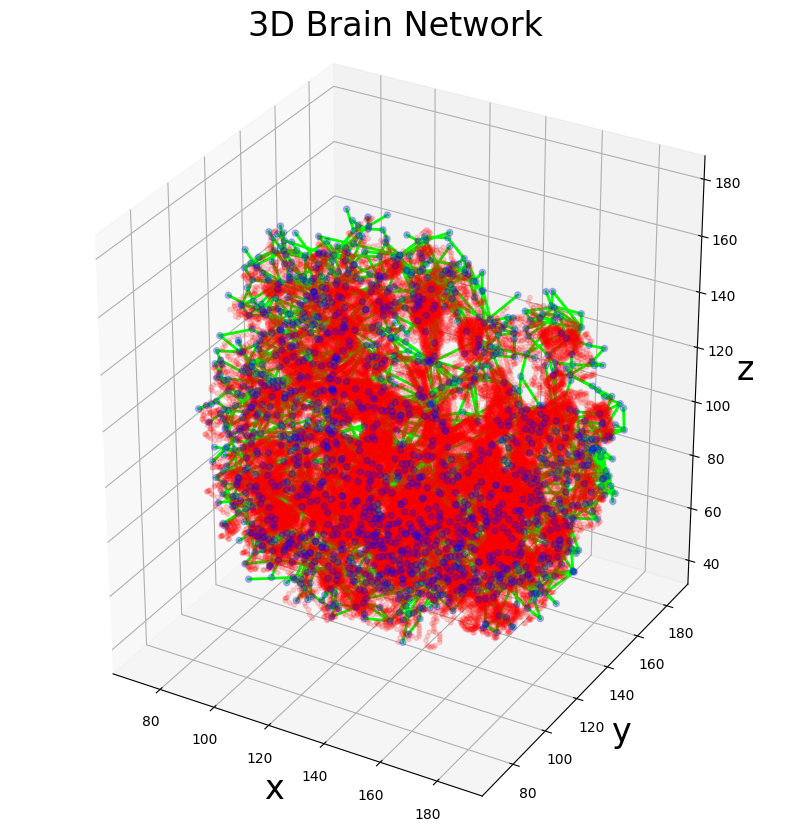

In [2]:
import networkx as nx
import os
import numpy as np
from glob import glob
import nibabel as nib
import nibabel.freesurfer.mghformat as mghf # read mgz images
from skimage.morphology import skeletonize_3d
from skimage.measure import marching_cubes
import matplotlib.pyplot as plt
from random import shuffle
# Path to the main directory containing the folders with data
main_directory = "PR-graphomics/sequences/"

# List all subfolders inside the main directory
folders = [f for f in os.listdir(main_directory) if os.path.isdir(os.path.join(main_directory, f))]
# Loop through each folder



for folder in folders:
    print(f"Accessing folder: {folder}")
    
    # Construct the path to the current folder
    folder_path = os.path.join(main_directory, folder)
    
     #In this way I add to the address the folder inside the first one
    folder_path = os.path.join(folder_path, os.listdir(folder_path)[0])
    graph_path = os.path.join(folder_path, 'sk-graph.pickle')
    image_path = os.path.join(folder_path, 'aparc.DKTatlas+aseg.deep.mgz')
    vol = mghf.load(image_path)

    # get the volume array
    volume = vol.get_fdata()

    # binarize the volume
    volume = volume != 0

    # extract the 3D mesh of the object for the plot
    verts, faces, normals, values = marching_cubes(volume, 0)


    # draw the object volume
    ptx, pty, ptz = verts.T

    skeleton = skeletonize_3d(volume)

    graph = nx.read_gpickle(graph_path)# plot the results

    print('Number of nodes: {:d}'.format(nx.number_of_nodes(graph)))
    print('Number of edges: {:d}'.format(nx.number_of_edges(graph)))
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(projection='3d')

    # draw the skeleton shape
    sx, sy, sz = np.where(skeleton)
    ax.scatter(sx, sy, sz, color='r', marker='o', s=10, alpha=0.15)

    # Extract graph node positions and normalize them to fit within the skeleton's coordinate system
    node_positions = np.array(graph.nodes)  # Assuming the nodes have 3D coordinates
    graph_min = node_positions.min(axis=0)
    graph_max = node_positions.max(axis=0)

    # Scale and shift graph nodes to match skeleton bounds
    skeleton_min = np.array([np.min(sx), np.min(sy), np.min(sz)])
    skeleton_max = np.array([np.max(sx), np.max(sy), np.max(sz)])

    # Normalize the graph coordinates to the skeleton range
    normalized_node_positions = (
        (node_positions - graph_min) / (graph_max - graph_min)
    ) * (skeleton_max - skeleton_min) + skeleton_min

    # Plot the normalized nodes as blue dots
    ax.scatter(normalized_node_positions[:, 0], normalized_node_positions[:, 1], normalized_node_positions[:, 2],
               color='b', marker='o', s=20, alpha=0.25)
        
    # Plot the edges as lines between nodes
    for ex, ey in graph.edges():
        ex_pos = normalized_node_positions[list(graph.nodes).index(ex)]
        ey_pos = normalized_node_positions[list(graph.nodes).index(ey)]
        ax.plot(*zip(ex_pos, ey_pos), color='lime', linewidth=2)
        
    # Adjust the axis limits to cover both skeleton and graph
    ax.set_xlim([np.min(sx), np.max(sx)])
    ax.set_ylim([np.min(sy), np.max(sy)])
    ax.set_zlim([np.min(sz), np.max(sz)])

    # Set equal aspect ratio for x, y, and z axes
    ax.set_box_aspect((np.ptp(sx), np.ptp(sy), np.ptp(sz)))


    ax.set_box_aspect((np.ptp(ptx), np.ptp(pty), np.ptp(ptz)))
    ax.set_xlabel('x', fontsize=24)
    ax.set_ylabel('y', fontsize=24)
    ax.set_zlabel('z', fontsize=24)
    _ = ax.set_title('3D Brain Network', fontsize=24)
    break


Accessing folder: 51731


/tmp/ipykernel_36516/2386617254.py:41: FutureWarning: `skeletonize_3d` is deprecated since version 0.23 and will be removed in version 0.25. Use `skimage.morphology.skeletonize` instead.
  skeleton = skeletonize_3d(volume)


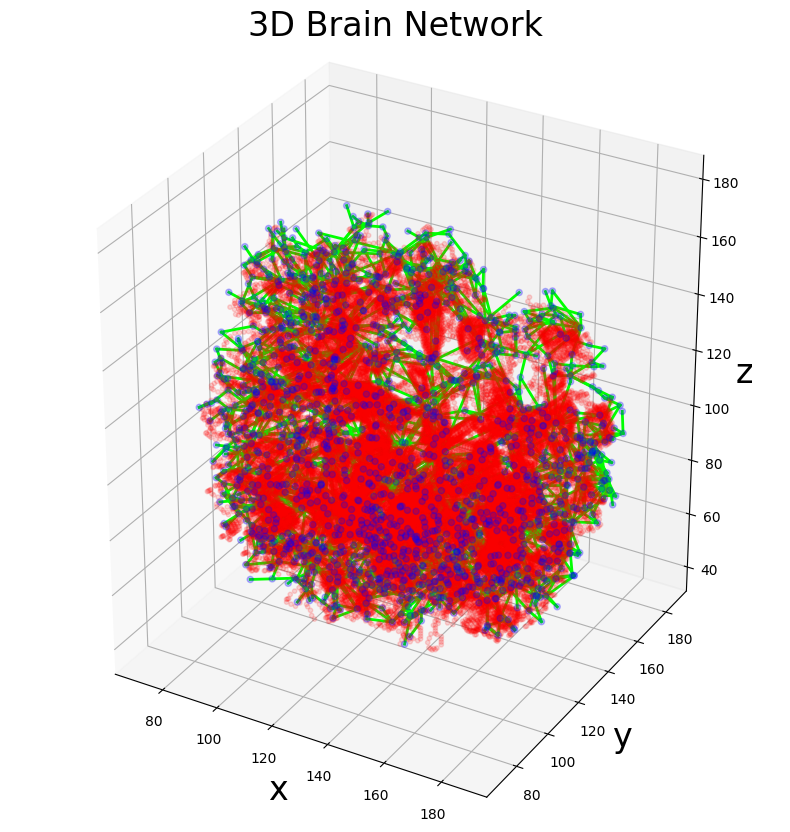

In [42]:
import os
import nibabel.freesurfer.mghformat as mghf
import numpy as np
import networkx as nx
from skimage.measure import marching_cubes
from skimage.morphology import skeletonize_3d
import matplotlib.pyplot as plt

# Function to rescale node positions
def rescale_coordinates(node_positions, skeleton_coords):
    graph_min = node_positions.min(axis=0)
    graph_max = node_positions.max(axis=0)
    skeleton_min = skeleton_coords.min(axis=0)
    skeleton_max = skeleton_coords.max(axis=0)

    normalized_node_positions = (
        (node_positions - graph_min) / (graph_max - graph_min)
    ) * (skeleton_max - skeleton_min) + skeleton_min

    return normalized_node_positions

# Example loop over folders
for folder in folders:
    print(f"Accessing folder: {folder}")
    
    # Construct the path to the current folder
    folder_path = os.path.join(main_directory, folder)
    
    # Add the folder inside the first one
    folder_path = os.path.join(folder_path, os.listdir(folder_path)[0])
    graph_path = os.path.join(folder_path, 'sk-graph.pickle')
    image_path = os.path.join(folder_path, 'aparc.DKTatlas+aseg.deep.mgz')
    
    # Load the volume and graph
    vol = mghf.load(image_path)
    volume = vol.get_fdata()
    volume = volume != 0
    verts, faces, normals, values = marching_cubes(volume, 0)

    ptx, pty, ptz = verts.T
    skeleton = skeletonize_3d(volume)
    graph = nx.read_gpickle(graph_path)
    
    # Extract skeleton coordinates
    sx, sy, sz = np.where(skeleton)
    skeleton_coords = np.vstack((sx, sy, sz)).T

    # Extract graph node positions
    node_positions = np.array(graph.nodes, dtype=float)

    # Rescale graph node positions to fit the skeleton's coordinates
    normalized_node_positions = rescale_coordinates(node_positions, skeleton_coords)

    # Plotting
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(projection='3d')

    # Draw the skeleton
    ax.scatter(sx, sy, sz, color='r', marker='o', s=10, alpha=0.15)

    # Plot the rescaled nodes
    ax.scatter(normalized_node_positions[:, 0], normalized_node_positions[:, 1], normalized_node_positions[:, 2],
               color='b', marker='o', s=20, alpha=0.25)

    # Plot edges
    for ex, ey in graph.edges():
        ex_pos = normalized_node_positions[list(graph.nodes).index(ex)]
        ey_pos = normalized_node_positions[list(graph.nodes).index(ey)]
        ax.plot(*zip(ex_pos, ey_pos), color='lime', linewidth=2)
    
    # Set axis limits and aspect ratio
    ax.set_xlim([np.min(sx), np.max(sx)])
    ax.set_ylim([np.min(sy), np.max(sy)])
    ax.set_zlim([np.min(sz), np.max(sz)])
    ax.set_box_aspect((np.ptp(sx), np.ptp(sy), np.ptp(sz)))

    ax.set_xlabel('x', fontsize=24)
    ax.set_ylabel('y', fontsize=24)
    ax.set_zlabel('z', fontsize=24)
    ax.set_title('3D Brain Network', fontsize=24)
    
    plt.show()
    break  # Stop after the first folder for now

In [4]:

# Path to the main directory containing the folders with data
main_directory = "PR-graphomics/sequences/"

# List all subfolders inside the main directory
folders = [f for f in os.listdir(main_directory) if os.path.isdir(os.path.join(main_directory, f))]
folder = folders[10]

print(f"Accessing folder: {folder}")
folder_path = os.path.join(main_directory, folder)
    
#In this way I add to the address the folder inside the first one
folder_path = os.path.join(folder_path, os.listdir(folder_path)[0])
#aparc.DKTatlas+aseg.deep.mgz aparc.DKTatlas+aseg.deep.nii.gz
image_path = os.path.join(folder_path, 'aparc.DKTatlas+aseg.deep.mgz')
vol = mghf.load(image_path)

header = vol.header
print(header)

# Extract the volumetric data (it could be a 3D or 4D array)
volume = vol.get_fdata()

# Check the shape of the volume to see if there are multiple layers
print("Volume shape:", volume.shape)

# If the volume has an extra dimension (e.g., 4D), you might have multiple layers, possibly including ROIs
# Example: if shape is (256, 256, 256, 2), the last dimension might correspond to different data types
if volume.ndim == 4:
    rois = volume[:, :, :, 1]  # Assume that the 2nd layer contains the ROIs
    print("ROI shape:", rois.shape)

Accessing folder: 54373
<class 'nibabel.freesurfer.mghformat.MGHHeader'> object, endian='>'
version      : 1
dims         : [256 256 256   1]
type         : 4
dof          : 0
goodRASFlag  : 1
delta        : [1. 1. 1.]
Mdc          : [[-1.  0.  0.]
 [ 0.  0. -1.]
 [ 0.  1.  0.]]
Pxyz_c       : [246.80212 265.28    486.44   ]
tr           : 0.0
flip_angle   : 0.0
te           : 0.0
ti           : 0.0
fov          : 256.0
Volume shape: (256, 256, 256)


In [5]:

image_path = os.path.join(folder_path, 'aparc.DKTatlas+aseg.deep.nii.gz')
img = nib.load(image_path)

# Get data from the file
data = img.get_fdata()
print(data.shape)


(256, 256, 256)


In [6]:
#PR-graphomics/labelmap.csv
import nibabel.freesurfer as fs
import pandas as pd

df = pd.read_csv('PR-graphomics/labelmap.csv', sep = ',')
df[0:10]


,GrayLevel,StructName
0,2,Left-Cerebral-White-Matter
1,4,Left-Lateral-Ventricle
2,5,Left-Inf-Lat-Vent
3,7,Left-Cerebellum-White-Matter
4,8,Left-Cerebellum-Cortex
5,10,Left-Thalamus
6,11,Left-Caudate
7,12,Left-Putamen
8,13,Left-Pallidum
9,14,3rd-Ventricle


In [7]:
import nibabel as nib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.measure import marching_cubes
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.cm as cm

# Prints the ROI according to the dataframe opened above.


folder_path = os.path.join(main_directory, folder)
    
folder_path = os.path.join(folder_path, os.listdir(folder_path)[0])
mgz_path = os.path.join(folder_path, 'aparc.DKTatlas+aseg.deep.mgz')
img = nib.load(mgz_path)

# Get the volume data from the MGZ file
volume = img.get_fdata()

# Sample DataFrame df (Assumed to have graylevels and corresponding labels)
# Replace this with your actual DataFrame
# Example DataFrame:
# df = pd.DataFrame({
#     'graylevel': [1, 2, 3, 4],
#     'label': ['Region1', 'Region2', 'Region3', 'Region4']
# })

# Ensure you have df containing 'graylevel' and 'label'
# df should be defined already as per your problem statement

# Plot the 3D regions using different colors for each region based on the graylevel

fig = plt.figure(figsize=(100, 100))
ax = fig.add_subplot(projection='3d')

# For each region in the parcellation DataFrame, we extract the corresponding voxels
for index, row in df.iterrows():
    graylevel = row['GrayLevel']
    region_name = row['StructName']
    
    # Create a binary mask where the current region graylevel matches the volume
    region_mask = volume == graylevel
    
    # If the region is not empty, plot it
    if np.any(region_mask):
        # Extract the 3D mesh of the object using marching cubes
        verts, faces, normals, values = marching_cubes(region_mask, 0)
        
        # Create a random color for each region using a colormap
        color = cm.plasma(index / len(df))
        
        # Plot the 3D surface
        ptx, pty, ptz = verts.T
        ax.plot_trisurf(ptx, pty, faces, ptz, color=color, alpha=0.15, lw=0)
        ax.set_box_aspect((np.ptp(ptx), np.ptp(pty), np.ptp(ptz)))
        
        # Optional: Add a label for the region (at the centroid of the region)
        centroid = np.mean(verts, axis=0)
        #ax.text(centroid[0], centroid[1], centroid[2], region_name, color='black', fontsize=10)

# Set labels and plot details
ax.set_xlabel('X', fontsize=15)
ax.set_ylabel('Y', fontsize=15)
ax.set_zlabel('Z', fontsize=15)
plt.title('3D Brain Parcellation with Regions', fontsize=20)
plt.show()

Volume shape: (256, 256, 256)
Number of vertices: (290845, 3)
Number of faces: (588918, 3)


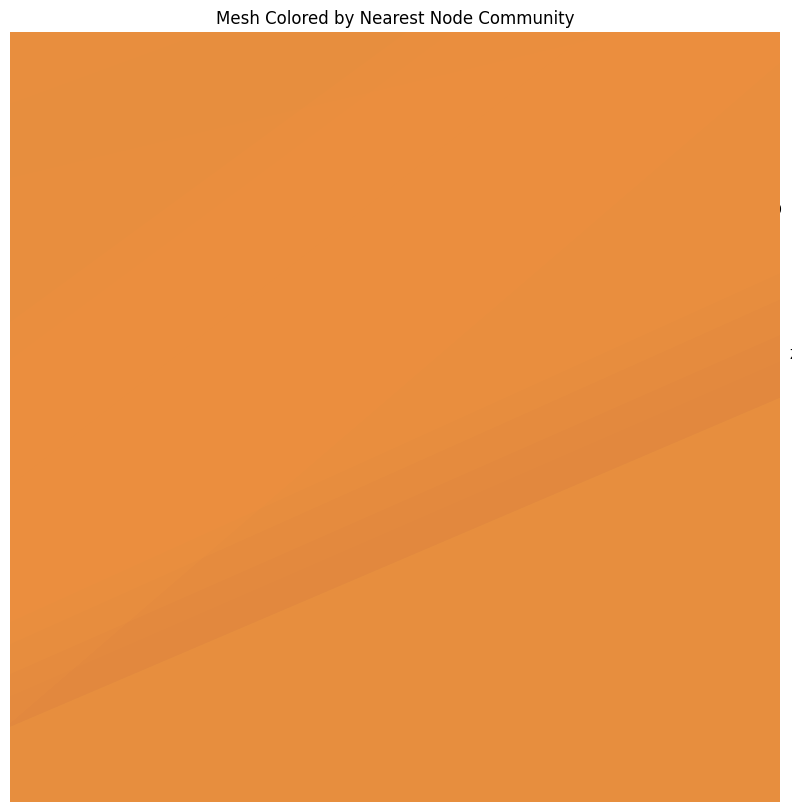

In [39]:
import nibabel as nib
import numpy as np
import networkx as nx
from skimage.measure import marching_cubes
from scipy.spatial import cKDTree
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.cm as cm

# Load the network and extract node positions
graph = nx.read_gpickle(graph_path)  # Replace with your graph path

# Extract node positions
node_positions = []
node_to_community = {}
communities = list(nx.community.louvain_communities(graph, seed=42))

# Assign nodes to communities
for community_idx, community in enumerate(communities):
    for node in community:
        x, y, z = node # Assuming node is stored as '[x, y, z]'
        node_positions.append([x, y, z])
        node_to_community[tuple([x, y, z])] = community_idx

# Build a KD-Tree for efficient nearest neighbor search
node_positions = np.array(node_positions)
tree = cKDTree(node_positions)

# Load 3D binarized volume and check size
volume = vol.get_fdata()
# binarize the volume
volume = volume != 0  # Replace with your actual file
print(f"Volume shape: {volume.shape}")

# Extract the surface mesh using marching cubes
verts, faces, normals, values = marching_cubes(volume, 0)
print(f"Number of vertices: {verts.shape}")
print(f"Number of faces: {faces.shape}")

# Query all vertices at once using KDTree for efficiency
dists, indices = tree.query(verts)

# Prepare the colormap
n_communities = len(communities)
cmap = cm.get_cmap('plasma', n_communities)

# Assign colors to the faces based on the nearest vertex's community
face_colors = np.zeros((faces.shape[0], 4))  # Preallocate array for face colors
for i, face in enumerate(faces):
    # Use the first vertex in the face to determine its color
    nearest_node_idx = indices[face[0]]
    nearest_node_pos = node_positions[nearest_node_idx]
    community_idx = node_to_community[tuple(nearest_node_pos)]
    
    # Assign the color based on the community index
    face_colors[i] = cmap(community_idx)

# Plot the colored mesh
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(projection='3d')

# Plot the surface mesh with precomputed face colors
mesh = Poly3DCollection(verts[faces], facecolors=face_colors, lw=0.1, alpha=0.08)
ax.add_collection3d(mesh)

# Set plot parameters
#ax.set_box_aspect([np.ptp(verts[:, 0]), np.ptp(verts[:, 1]), np.ptp(verts[:, 2])])
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
plt.title('Mesh Colored by Nearest Node Community')
plt.show()

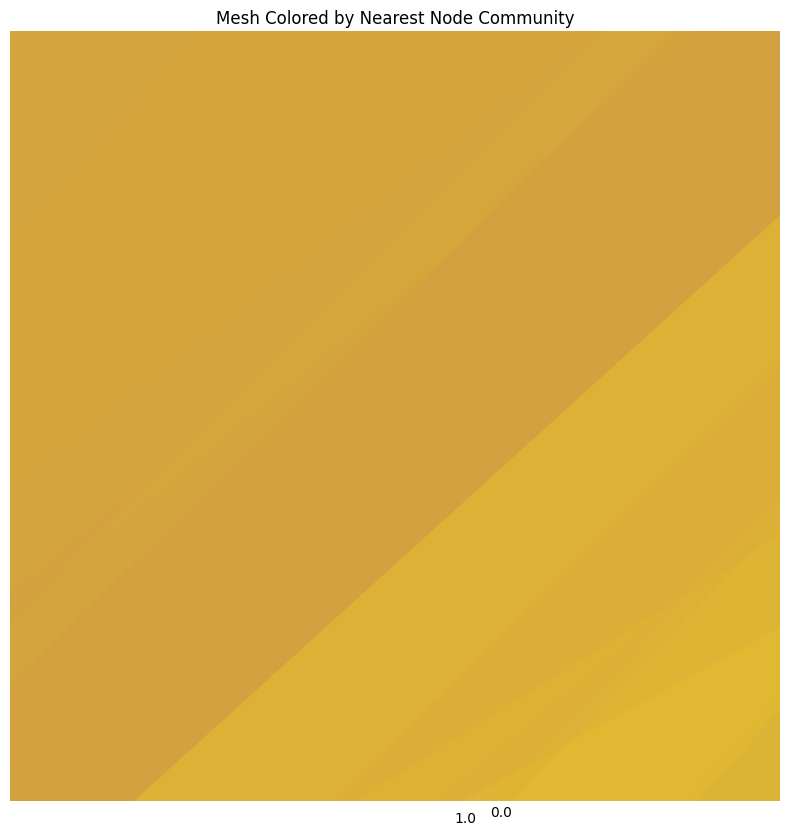

In [9]:
import nibabel as nib
import numpy as np
import networkx as nx
from skimage.measure import marching_cubes
from scipy.spatial import cKDTree
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.cm as cm

# Load the network and extract node positions
graph = nx.read_gpickle(graph_path)  # Replace with your graph path

# Extract node positions
node_positions = []
node_to_community = {}
communities = list(nx.community.louvain_communities(graph, seed=42))

# Assign nodes to communities
for community_idx, community in enumerate(communities):
    for node in community:
        x, y, z = node  # Assuming nodes are stored as strings of [x, y, z]
        node_positions.append([x, y, z])
        node_to_community[tuple([x, y, z])] = community_idx

# Build a KD-Tree for efficient nearest neighbor search
tree = cKDTree(node_positions)

# Load 3D binarized volume
volume = vol.get_fdata()
volume = volume != 0 

# Extract the surface mesh using marching cubes
verts, faces, normals, values = marching_cubes(volume, 0)

# Prepare the colormap
n_communities = len(communities)
cmap = cm.get_cmap('plasma', n_communities)

# Prepare face colors
face_colors = []

# For each face, find the nearest node for each of its vertices
for face in faces:
    # Get the vertices of the face
    face_vertices = verts[face]

    # Find the nearest node for each vertex of the face
    community_indices = []
    for vert in face_vertices:
        dist, idx = tree.query(vert)
        nearest_node = node_positions[idx]
        community_indices.append(node_to_community[tuple(nearest_node)])

    # Assign the color of the face based on the nearest node community
    # Here, I'm simply using the first vertex's community, but you could take an average or mode if needed
    face_color = cmap(community_indices[0])  # You could use different logic here
    face_colors.append(face_color)

# Plot the colored mesh
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(projection='3d')

# Plot the surface mesh
mesh = Poly3DCollection(verts[faces], facecolors=face_colors, lw=0.1, alpha=0.08)
ax.add_collection3d(mesh)

# Set plot parameters
ax.set_box_aspect([np.ptp(verts[:, 0]), np.ptp(verts[:, 1]), np.ptp(verts[:, 2])])
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
plt.title('Mesh Colored by Nearest Node Community')
plt.show()
